In [3]:
import os
from PIL import Image
import matplotlib.pyplot as plt


In [2]:
folder_path = 'malimg_paper_dataset_imgs'
min_observaciones = 10
# Obtener lista de subcarpetas (cada una representa una familia)
subfolders = [f.path for f in os.scandir(folder_path) if f.is_dir()]

# Contar el número de imágenes en cada subcarpeta
for subfolder in subfolders:
    images = [f for f in os.listdir(subfolder) if f.endswith('.png')]
    if len(images) >= min_observaciones:
        print('Familia:', os.path.basename(subfolder))
        print('Número de ejemplares:', len(images))

Familia: Adialer.C
Número de ejemplares: 122
Familia: Agent.FYI
Número de ejemplares: 116
Familia: Allaple.A
Número de ejemplares: 2949
Familia: Allaple.L
Número de ejemplares: 1591
Familia: Alueron.gen!J
Número de ejemplares: 198
Familia: Autorun.K
Número de ejemplares: 106
Familia: C2LOP.gen!g
Número de ejemplares: 200
Familia: C2LOP.P
Número de ejemplares: 146
Familia: Dialplatform.B
Número de ejemplares: 177
Familia: Dontovo.A
Número de ejemplares: 162
Familia: Fakerean
Número de ejemplares: 381
Familia: Instantaccess
Número de ejemplares: 431
Familia: Lolyda.AA1
Número de ejemplares: 213
Familia: Lolyda.AA2
Número de ejemplares: 184
Familia: Lolyda.AA3
Número de ejemplares: 123
Familia: Lolyda.AT
Número de ejemplares: 159
Familia: Malex.gen!J
Número de ejemplares: 136
Familia: Obfuscator.AD
Número de ejemplares: 142
Familia: Rbot!gen
Número de ejemplares: 158
Familia: Skintrim.N
Número de ejemplares: 80
Familia: Swizzor.gen!E
Número de ejemplares: 128
Familia: Swizzor.gen!I
Número

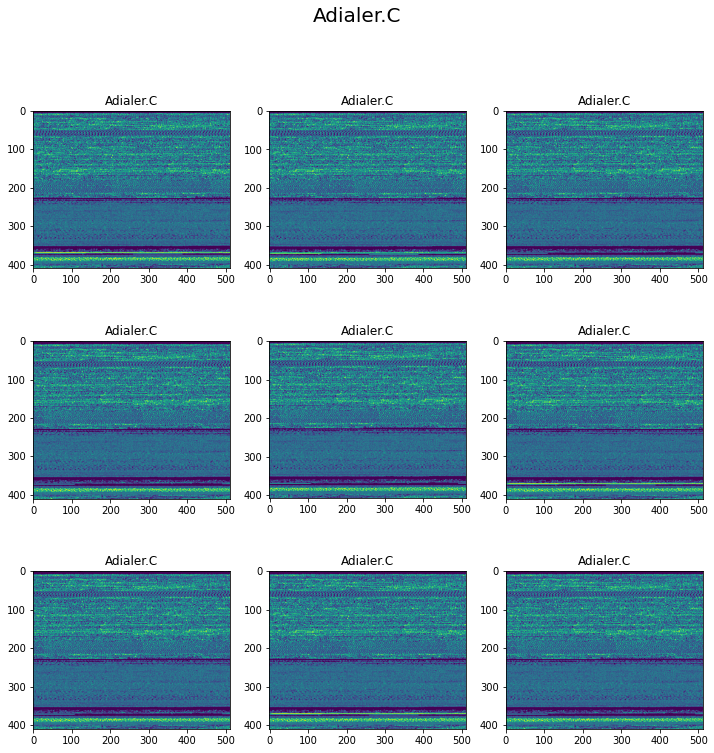

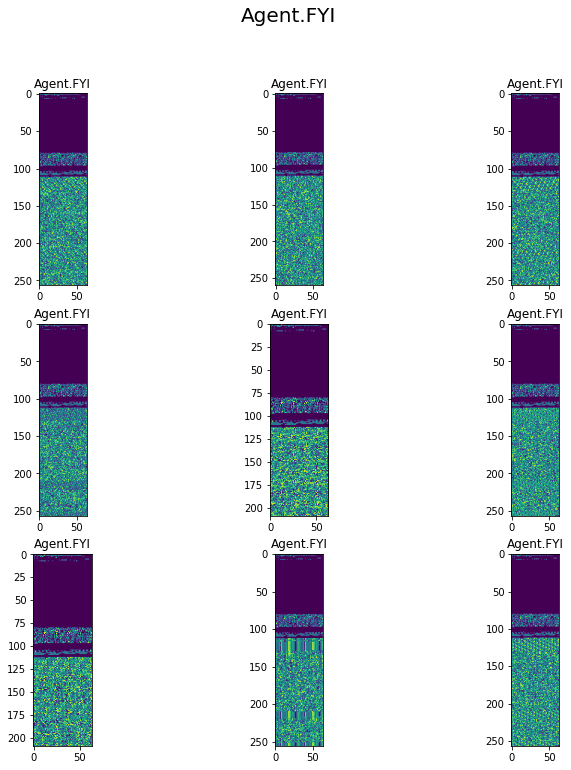

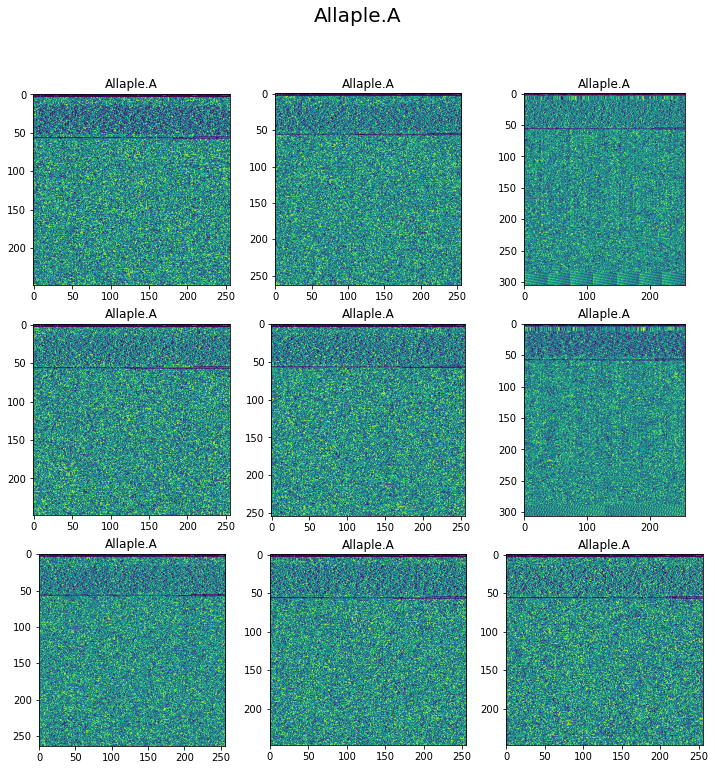

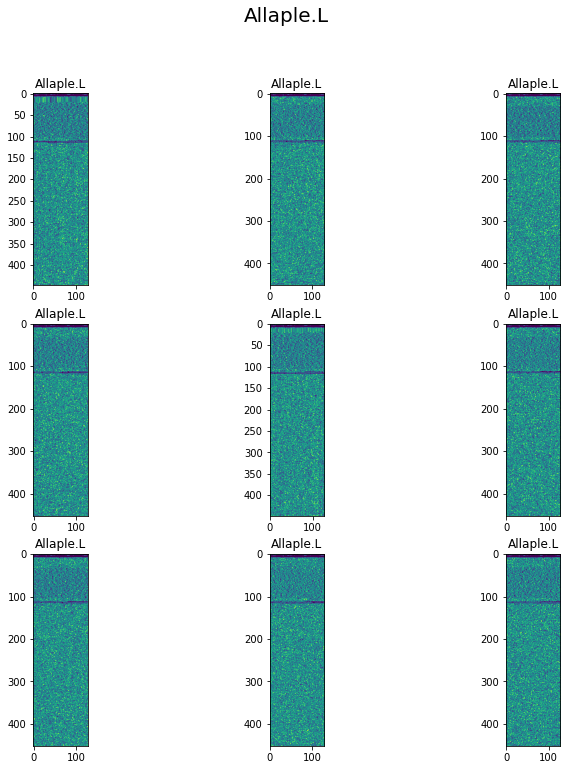

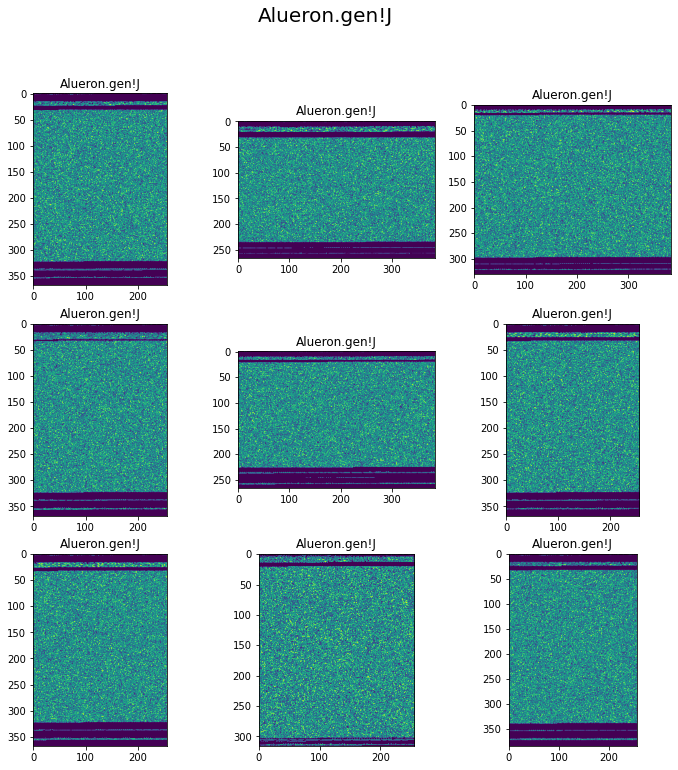

...

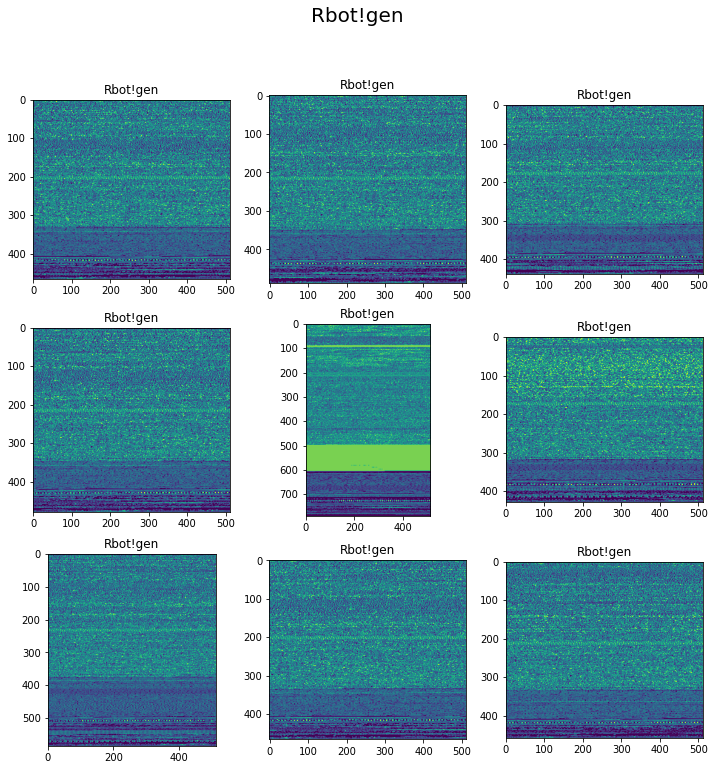

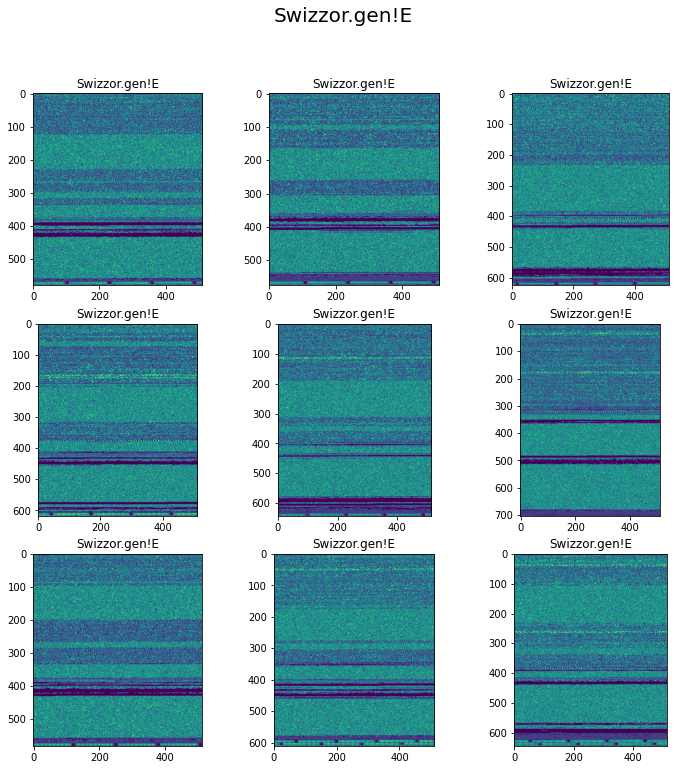

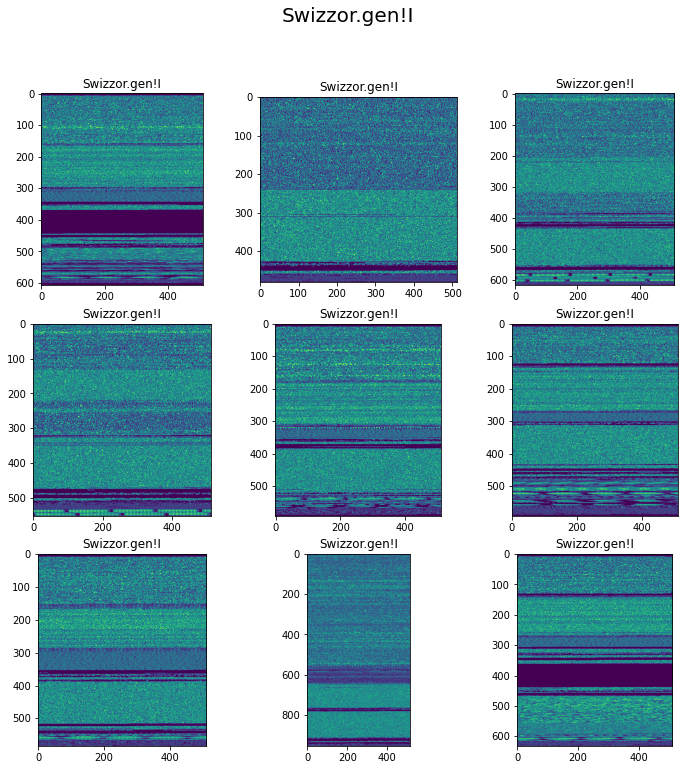

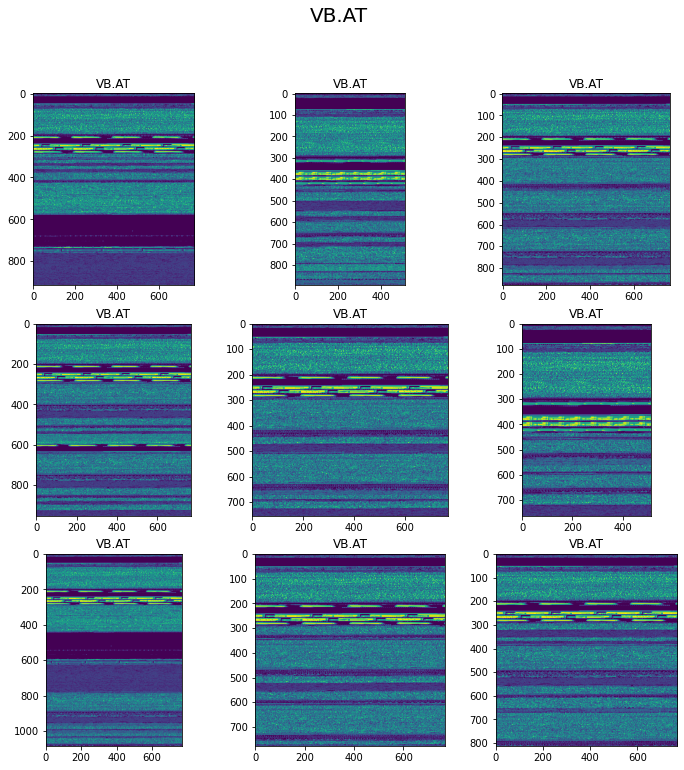

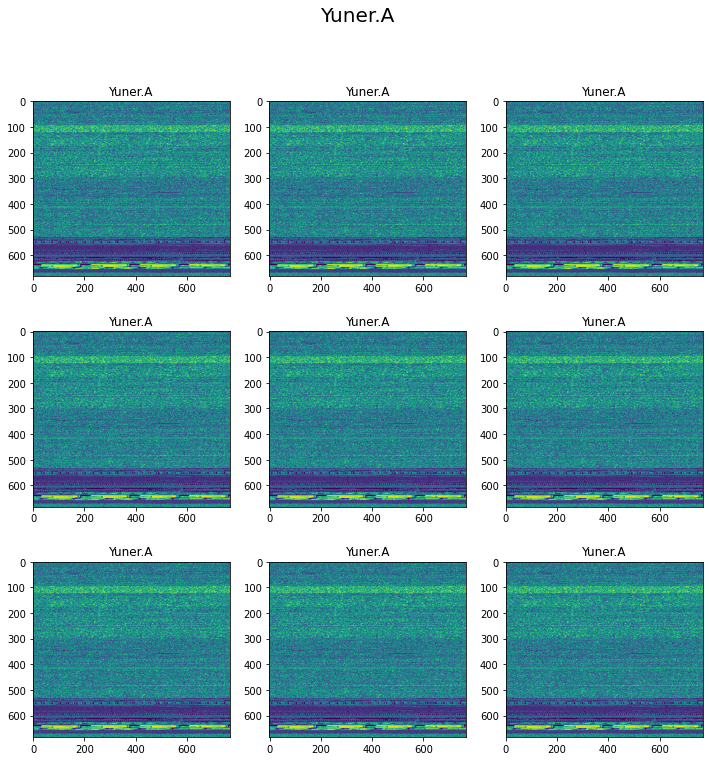

In [16]:
# Ruta a la carpeta con las imágenes de malware
dir_path = "malimg_paper_dataset_imgs"
min_obs = 100

for family in os.listdir(dir_path):
    family_dir = os.path.join(dir_path, family)
    if os.path.isdir(family_dir):
        count = 0
        for filename in os.listdir(family_dir):
            if filename.endswith('.png'):
                im = Image.open(os.path.join(family_dir, filename))
                count += 1
        if count >= min_obs:
            fig, axs = plt.subplots(3, 3, figsize=(12,12))
            fig.suptitle(family, fontsize=20)
            i = 0
            for filename in os.listdir(family_dir):
                if filename.endswith('.png'):
                    im = Image.open(os.path.join(family_dir, filename))
                    axs[i//3, i%3].imshow(im)
                    axs[i//3, i%3].set_title(family)
                    i += 1
                    if i == 9:
                        break
            plt.show()
# Muestra el número de imágenes por familia de malware


In [17]:
import numpy as np

def load_images(directory):
    X = []
    y = []
    for family_dir in os.listdir(directory):
        if family_dir.startswith('.'):
            continue
        family = family_dir.split('_')[0]
        for filename in os.listdir(os.path.join(directory, family_dir)):
            if filename.endswith('.png'):
                im = Image.open(os.path.join(directory, family_dir, filename))
                im = im.convert('RGB')
                im = im.resize((64, 64))
                X.append(np.array(im))
                y.append(family)
    X = np.array(X)
    y = np.array(y)
    return X, y

In [18]:
from sklearn.model_selection import train_test_split
X, y = load_images(dir_path)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [21]:
from sklearn.preprocessing import LabelEncoder

# Crea una instancia de LabelEncoder
label_encoder = LabelEncoder()

# Codifica las etiquetas de cadena en valores enteros
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)

In [22]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(len(np.unique(y)), activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 31, 31, 32)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 30752)             0         
                                                                 
 dense_2 (Dense)             (None, 128)               3936384   
                                                                 
 dense_3 (Dense)             (None, 25)                3225      
                                                                 
Total params: 3,940,505
Trainable params: 3,940,505
Non-trainable params: 0
____________________________________________

In [23]:
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/10
205/205 [==============================] - 12s 56ms/step - loss: 35.2891 - accuracy: 0.8206 - val_loss: 0.3652 - val_accuracy: 0.9236
Epoch 2/10
205/205 [==============================] - 11s 54ms/step - loss: 0.2598 - accuracy: 0.9524 - val_loss: 0.2272 - val_accuracy: 0.9554
Epoch 3/10
205/205 [==============================] - 11s 54ms/step - loss: 0.1284 - accuracy: 0.9693 - val_loss: 0.2109 - val_accuracy: 0.9579
Epoch 4/10
205/205 [==============================] - 11s 56ms/step - loss: 0.0964 - accuracy: 0.9754 - val_loss: 0.2298 - val_accuracy: 0.9590
Epoch 5/10
205/205 [==============================] - 11s 54ms/step - loss: 0.0726 - accuracy: 0.9787 - val_loss: 0.2088 - val_accuracy: 0.9607
Epoch 6/10
205/205 [==============================] - 11s 53ms/step - loss: 0.0610 - accuracy: 0.9827 - val_loss: 0.2350 - val_accuracy: 0.9575
Epoch 7/10
205/205 [==============================] - 12s 61ms/step - loss: 0.0508 - accuracy: 0.9844 - val_loss: 0.2378 - val_accuracy

In [24]:
loss, accuracy = model.evaluate(X_test, y_test)
print('Pérdida: ', loss)
print('Precisión: ', accuracy)

88/88 [==============================] - 1s 14ms/step - loss: 0.3307 - accuracy: 0.9518
Pérdida:  0.3306638300418854
Precisión:  0.9518201351165771


In [33]:
from sklearn.metrics import f1_score, precision_score, accuracy_score
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, average_precision_score
# Obtener las predicciones del conjunto de prueba
y_pred = model.predict(X_test)

# Convertir las predicciones a etiquetas de clase
y_pred_labels = np.argmax(y_pred, axis=1)

# Calcular y mostrar las métricas
print('F1 score:', f1_score(y_test, y_pred_labels, average='weighted'))
print('Precision:', precision_score(y_test, y_pred_labels, average='weighted'))
print('Accuracy:', accuracy_score(y_test, y_pred_labels))
# Obtener la matriz de confusión
cm = confusion_matrix(y_test, y_pred_labels)

# Obtener el reporte de clasificación (precision, recall, f1-score, support) por clase
class_names = np.unique(y_train).astype(str)
print(classification_report(y_test, y_pred_labels, target_names=class_names))

# Obtener el área bajo la curva ROC
roc_auc = roc_auc_score(y_test, y_pred, multi_class='ovr')
print('ROC AUC:', roc_auc)



88/88 [==============================] - 1s 14ms/step
F1 score: 0.945732883481938
Precision: 0.9415701591262318
Accuracy: 0.9518201284796574
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        51
           1       1.00      0.94      0.97        33
           2       1.00      0.99      1.00       899
           3       0.98      1.00      0.99       457
           4       1.00      0.98      0.99        66
           5       0.00      0.00      0.00        34
           6       0.52      0.60      0.55        47
           7       0.63      0.62      0.63        50
           8       1.00      1.00      1.00        60
           9       1.00      1.00      1.00        50
          10       1.00      0.99      1.00       104
          11       0.99      1.00      1.00       137
          12       1.00      0.98      0.99        51
          13       0.97      1.00      0.98        57
          14       0.97      1.00      0.99     

c:\Users\ravz2\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ravz2\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ravz2\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_s

In [34]:
cm

array([[ 51,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,  31,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   2,   0,   0],
       [  0,   0, 894,   5,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 457,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,  65,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   1,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  34],
       [  0,   0,   0,   0,   0,   0,  28,  13,   0,   0,   0,   0,   0,
          0,   1,   0,   0,   0,   0,   0,   1,   2,   1,   1,   0],
      

Los resultados obtenidos en el análisis del dataset de familias de malware clasificados son bastante buenos. La precisión, medida de la proporción de verdaderos positivos entre verdaderos y falsos positivos, es de 0.941, lo que indica que la mayoría de los resultados positivos obtenidos son realmente positivos. El F1 score, que combina precisión y recall, es de 0.945, lo que indica un buen equilibrio entre la precisión y la exhaustividad. 

La exactitud (accuracy), que mide la proporción de resultados correctamente clasificados, es de 0.952, lo que indica que el modelo es capaz de clasificar correctamente la mayoría de las muestras. 

El informe de clasificación muestra que el modelo es particularmente bueno para clasificar las clases 0, 2, 3, 8, 9, 10, 11, 12, 13, 14, 15, 16 y 17, con una precisión del 100% para varias de estas clases. Sin embargo, el modelo tiene dificultades para clasificar las clases 5, 6 y 18, con una precisión de 0% para la clase 5 y una precisión del 52% y 83% para las clases 6 y 18, respectivamente. 

El área bajo la curva ROC es de 0.99, lo que indica que el modelo es capaz de distinguir entre las diferentes clases con un alto grado de precisión. 

En general, se puede concluir que el modelo es capaz de clasificar con alta precisión y exhaustividad la mayoría de las clases del dataset, con algunas excepciones en las que la precisión es menor. Sin embargo, es importante destacar que estos resultados pueden ser mejorados con un ajuste más detallado del modelo y una exploración más exhaustiva de los hiperparámetros.